## RL LunarLander: Simple DQN with PyTorch

In [1]:
import numpy as np
import gym
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from collections import deque, namedtuple
import time
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [27]:

# Environmental global variables:
SEED = 42

# Making the environment:
env = gym.make('LunarLander-v2')
env.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
random.seed(SEED)
env.action_space.seed(SEED)  # Ensures deterministic action sampling

# Hyperparameters:
learning_rate = 5e-4
gamma = 1.0
num_episodes = 1000
replay_memory_capacity = int(1e5)
batch_size = 64
target_update_frequency = 2
epsilon_decay = 0.995
epsilon_min = 0.005
epsilon_init = 1.0
TAU = 1e-3
SEED = 42

# Defining the neural network:
space_dim = env.observation_space.shape[0]
action_dim = env.action_space.n
print(f"Space_dim: {space_dim}, Action_dim: {action_dim}")



class Model(nn.Module):
    def __init__(self, state_size, action_size):
        super(Model, self).__init__()
        self.seed = torch.manual_seed(SEED)
        self.fc1 = nn.Linear(state_size, 64)
        self.fc2 = nn.Linear(64, 64)
        self.fc3 = nn.Linear(64, action_size)

    def forward(self, state):
        state = F.relu(self.fc1(state))
        state = F.relu(self.fc2(state))
        action_q_values = self.fc3(state)
        return action_q_values
    
# Defining the ReplayBuffer
class ReplayBuffer:
    def __init__(self, buffer_size, action_size):
        self.seed = random.seed(SEED)
        self.action_size = action_size
        self.memory = deque(maxlen=buffer_size)
        self.experiences = namedtuple("Experiences", field_names=["state","action","reward","new_state", "done"])
        
    def add(self, state, action, reward, new_state, done):
        e = self.experiences(state, action, reward, new_state, done)
        self.memory.append(e)
        
    def sample(self, batch_size):
        experiences = random.sample(self.memory, k=batch_size)
        
        states = torch.from_numpy(np.vstack([e.state for e in experiences if e is not None])).float().to(device)
        actions = torch.from_numpy(np.vstack([e.action for e in experiences if e is not None])).long().to(device)
        rewards = torch.from_numpy(np.vstack([e.reward for e in experiences if e is not None])).float().to(device)
        new_states = torch.from_numpy(np.vstack([e.new_state for e in experiences if e is not None])).float().to(device)
        dones = torch.from_numpy(np.vstack([e.done for e in experiences if e is not None]).astype(np.uint8)).float().to(device)
        
        return states, actions, rewards, new_states, dones
    
    def __len__(self):
        return len(self.memory)

# Defining the DQN Agent:
class DQNAgent:
    def __init__(self, state_size, action_size):
        self.seed = random.seed(SEED)
        self.state_size = state_size
        self.action_size = action_size

        self.local_nn = Model(state_size=state_size, action_size=action_size).to(device)
        self.target_nn = Model(state_size=state_size, action_size=action_size).to(device)
        #self.local_nn = torch.compile(Model(state_size=state_size, action_size=action_size),mode ='default')
        #self.target_nn = torch.compile(Model(state_size=state_size, action_size=action_size),mode ='default')
        #self.local_nn.to(device)
        #self.target_nn.to(device)

        self.optimizer = optim.Adam(self.local_nn.parameters(), lr=learning_rate)

        self.memory = ReplayBuffer(replay_memory_capacity, action_size)
        self.t_step = 0
        self.tau = TAU
    
    def step(self, state, action, reward, next_state, done):
        self.memory.add(state=state, action=action, reward=reward, new_state=next_state, done=done)

        self.t_step = (self.t_step + 1) % target_update_frequency
        update_flag = self.t_step == 0
        if update_flag:
            if self.memory.__len__() > batch_size:
                experiences = self.memory.sample(batch_size)
                self.learn(experiences, gamma)

   
    def act(self, state, eps=0):
        state = torch.from_numpy(state).float().unsqueeze(0).to(device)
        self.local_nn.eval()
        with torch.no_grad():
            action_values = self.local_nn(state)
        self.local_nn.train()

        if random.random() > eps:
            return np.argmax(action_values.cpu().data.numpy())
        else:
            return random.choice(np.arange(self.action_size))
        
    def learn(self, experiences, gamma):
        states, actions, rewards, new_states, dones = experiences

        Q_target = self.target_nn(new_states).detach().max(1)[0].unsqueeze(1)
        Q_target_value = rewards + (gamma * Q_target * (1-dones) )

        Q_expected = self.local_nn(states).gather(1, actions)
        loss = F.mse_loss(Q_expected, Q_target_value)
        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        self.soft_update(self.local_nn, self.target_nn, self.tau)
    
    def soft_update(self, local_model, target_model, tau):
        for target_param, local_param in zip(target_model.parameters(), local_model.parameters()):
            target_param.data.copy_(tau*local_param.data + (1.0-tau)*target_param.data)


#Make the agent
agent = DQNAgent(state_size=space_dim, action_size=action_dim)


def update_epsilon(epsilon):
    return max(epsilon_min, epsilon * epsilon_decay)

def plot_training(mean_rewards_list, total_rewards_list):
    # Use Seaborn to plot rewards per episode
    sns.set_style("darkgrid")  # Set a nice style
    plt.figure(figsize=(10, 5))  # Set figure size

    sns.lineplot(x=range(len(total_rewards_list)), y=total_rewards_list, label="Total Reward per Episode")
    sns.lineplot(x=range(len(mean_rewards_list)), y=mean_rewards_list, label="Mean Reward (50 episodes)")

    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Training Progress: Rewards per Episode")
    plt.legend()
    plt.show()

#Making the RL_model
def train_Agent():
    
    epsilon = epsilon_init
    mean_rewards_list = []
    total_rewards_list = []
    best_mean_reward = -np.inf

    for i_episode in range(num_episodes):
        state = env.reset(seed=SEED)
        done = False
        episode_rewards = 0

        while not done:
            action = agent.act(state=state, eps=epsilon)
            next_state, reward, done, _ = env.step(action)
            agent.step(state, action, reward, next_state, done)
            state = next_state
            episode_rewards += reward

            if done:
                break

        epsilon = update_epsilon(epsilon)
        total_rewards_list.append(episode_rewards)
        mean_rewards = np.mean(total_rewards_list[-50:] if len(total_rewards_list) >= 50 else total_rewards_list)
        mean_rewards_list.append(mean_rewards)

        print(f" Episode: {i_episode}, Total Reward: {episode_rewards}, Mean Reward: {mean_rewards}, Epsilon: {epsilon}")

        if mean_rewards > best_mean_reward:
            best_mean_reward = mean_rewards
            torch.save(agent.local_nn.state_dict(), 'local_nn_parameters.pth')
            torch.save(agent.target_nn.state_dict(), 'target_nn_parameters.pth')
    

    plot_training(mean_rewards_list, total_rewards_list)
  

Space_dim: 8, Action_dim: 4


 Episode: 0, Total Reward: -146.9685244422169, Mean Reward: -146.9685244422169, Epsilon: 0.995
 Episode: 1, Total Reward: -386.86896141083605, Mean Reward: -266.9187429265265, Epsilon: 0.990025
 Episode: 2, Total Reward: -85.77661352341687, Mean Reward: -206.53803312548993, Epsilon: 0.985074875
 Episode: 3, Total Reward: -124.80319059487384, Mean Reward: -186.1043224928359, Epsilon: 0.9801495006250001
 Episode: 4, Total Reward: -153.46134188973903, Mean Reward: -179.57572637221654, Epsilon: 0.9752487531218751
 Episode: 5, Total Reward: -136.78430755358556, Mean Reward: -172.44382323577804, Epsilon: 0.9703725093562657
 Episode: 6, Total Reward: -244.73244403129755, Mean Reward: -182.7707690637094, Epsilon: 0.9655206468094844
 Episode: 7, Total Reward: -419.35654274289624, Mean Reward: -212.34399077360777, Epsilon: 0.960693043575437
 Episode: 8, Total Reward: -119.54364359497546, Mean Reward: -202.03284108709306, Epsilon: 0.9558895783575597
 Episode: 9, Total Reward: -108.2313051333135, 

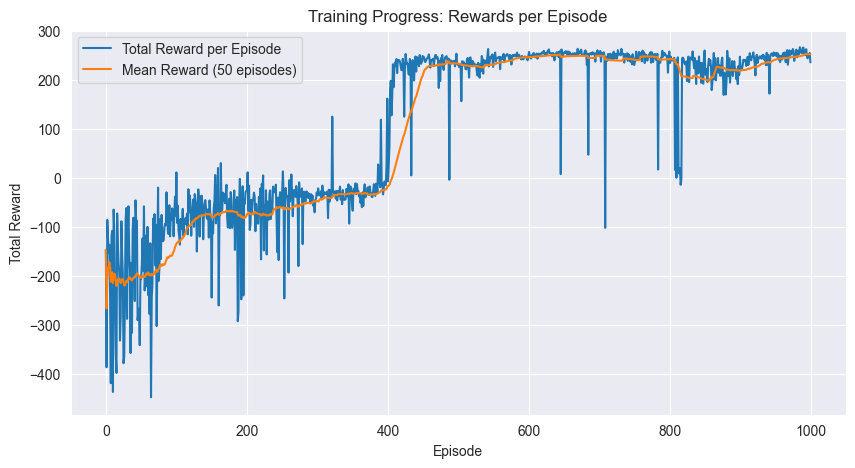

In [28]:
train_Agent()

In [30]:

# For plotting the animated video
import matplotlib.animation as animation
import matplotlib as mpl
mpl.rc('animation', html='jshtml')


def update_scene(num, frames, patch):
    patch.set_data(frames[num])
    return patch,

def plot_animation(frames, repeat=False, interval=40):
    fig = plt.figure()
    patch = plt.imshow(frames[0])
    plt.axis('off')

    anim = animation.FuncAnimation(
        fig, update_scene, fargs=(frames, patch),
        frames=len(frames), repeat=repeat, interval=interval)
    plt.close()
    return anim




state = env.reset()
done = False
score = 0 
agent.local_nn.load_state_dict(torch.load('local_nn_parameters.pth'))
agent.target_nn.load_state_dict(torch.load('target_nn_parameters.pth'))
# agent.local_nn.eval(
random.seed(None)  # Reset to default, random state
np.random.seed(None)

total_rewards = 0
mean_rewards = 0
frames = []
for eps in range(5):
    state = env.reset()
    score = 0
    done = False
    while not done:
        env.render()
        action = agent.act(state)
        state, reward, done, _ = env.step(action)
        score += reward
        img = env.render(mode="rgb_array")
        frames.append(img)
        if done:
            print(score)
            break
    total_rewards += score
    mean_rewards = total_rewards / (eps + 1)
    print(f"Episode: {eps}, Score: {score}, Mean Rewards: {mean_rewards}")
plot_animation(frames=frames)

    

271.18360168086843
Episode: 0, Score: 271.18360168086843, Mean Rewards: 271.18360168086843
234.16399549670726
Episode: 1, Score: 234.16399549670726, Mean Rewards: 252.67379858878786
279.1577179443429
Episode: 2, Score: 279.1577179443429, Mean Rewards: 261.5017717073062
26.60402709560296
Episode: 3, Score: 26.60402709560296, Mean Rewards: 202.7773355543804
267.42295608289646
Episode: 4, Score: 267.42295608289646, Mean Rewards: 215.7064596600836
